<a href="https://colab.research.google.com/github/lifesboy/selks-lstm-data/blob/main/SELKS_LSTM_Anomaly_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.LSTM KERAS

docs lib: https://keras.io/api/layers/recurrent_layers/lstm/

# 2.PREPARATION

In [1]:
#@title Check version vs GPU
!git --version
!python --version
!ray --version

import tensorflow as tf
print('tf version: ', tf.__version__)
print('tf.keras version:', tf.keras.__version__)

import sys
sys.version

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('Found GPU at: {}'.format(device_name))

git version 2.20.1
Python 2.7.16
ray, version 1.13.0
tf version:  2.7.0
tf.keras version: 2.7.0
Found GPU at: /device:GPU:0


2023-01-17 14:33:07.968041: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-17 14:33:10.273947: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-17 14:33:10.275179: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-17 14:33:10.276180: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capabilit

In [2]:
#@title Import Libraries
!mkdir -p /cic/images/

import sys
sys.path.insert(0, "/usr/local/opnsense/scripts/ml")

import ray
import pyarrow
import pyarrow as pa
from pyarrow import csv
from pandas import DataFrame

from ray.data import Dataset
from ray.data.aggregate import Count

import numpy as np
from numpy import array
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras import Input


import common
from anomaly_normalization import PS, LABEL, PAYLOAD_FEATURE_NUM, ALL_FEATURES
from aimodels.preprocessing.cicflowmeter_norm_model import CicFlowmeterNormModel
from aitests.testutils import show_scattered_4d, show_weights, show_4d_imgs, show_train_metric, IMG,\
read_csv_in_dir, read_csv_in_dir_label_string

run, client = common.init_experiment(name='notebook')


2023-01-17 14:33:13,186[INFO][140586977281856-MainThread] worker.py:init(957) Connecting to existing Ray cluster at address: 172.18.12.180:6379


# 3.INPUT
Let's generate a sample input with time dimension as below:

In [3]:
#@title Generate an input sequence
#10.0.2.10
#10.0.2.155
#10.0.2.180
#10.0.2.181
#10.0.2.182
#192.168.66.39
#192.168.66.21

cell_size = 256 #@param {type:"integer"} #numberOfLSTMunits
hidden_size = 128 #@param {type:"integer"}
n_timesteps_in = 100  #@param {type:"integer"}
n_features = 256   #@param {type:"integer"}

# generate datasets
train_size= 200 #@param {type:"integer"}
test_size = 50  #@param {type:"integer"}
batch_size=32 #@param {type:"integer"}
epochs=10 #@param {type:"integer"}

L_fsource = '/cic/dataset/featured_extracted/ssh-bruteforce-forward-https/' #@param {type:"string"}
L_source = '/cic/dataset/normalized_labeled/ssh-bruteforce-forward-https/' #@param {type:"string"}
L_fdata: Dataset = read_csv_in_dir_label_string(L_fsource)
L_data: Dataset = read_csv_in_dir(L_source)
L_fcount: DataFrame = L_fdata.groupby(LABEL).aggregate(Count()).to_pandas()
L_count: DataFrame = L_data.groupby(LABEL).aggregate(Count()).to_pandas()

features = [PS % i for i in range(0, PAYLOAD_FEATURE_NUM)]
features = features[0: n_features]
Lfpadding_features = sorted(list(set(features) - set(L_fdata.schema(fetch_if_missing=True).names)))
Lpadding_features = sorted(list(set(features) - set(L_data.schema(fetch_if_missing=True).names)))

print ('features=', features)
print ('Lfpadding_features=', Lfpadding_features)
print ('Lpadding_features=', Lpadding_features)

L_ftrain = DataFrame.from_records(L_fdata.take(train_size * n_timesteps_in)).fillna(0)
L_ftrain[Lfpadding_features] = 0
L_ftrain[LABEL] = L_ftrain.apply(lambda x: 'Anomaly' if x['src_ip'] == '172.18.12.113' else 'Benign', axis=1)
L_ftrain[LABEL] = L_ftrain[LABEL].apply(lambda x: 0 if x == 'Benign' else 1)
LX_ftrain = L_ftrain[features].to_numpy().reshape(train_size, n_timesteps_in, n_features)
Ly_ftrain = L_ftrain[[LABEL]].to_numpy().reshape(train_size, n_timesteps_in)

L_ftest = DataFrame.from_records(L_fdata.take(test_size * n_timesteps_in)).fillna(0)
L_ftest[Lfpadding_features] = 0
L_ftest[LABEL] = L_ftest.apply(lambda x: 'Anomaly' if x['src_ip'] == '172.18.12.113' else 'Benign', axis=1)
L_ftest[LABEL] = L_ftest[LABEL].apply(lambda x: 0 if x == 'Benign' else 1)
LX_ftest = L_ftest[features].to_numpy().reshape(test_size, n_timesteps_in, n_features)
Ly_ftest = L_ftest[[LABEL]].to_numpy().reshape(test_size, n_timesteps_in)

L_train = DataFrame.from_records(L_data.take(train_size * n_timesteps_in)).fillna(0)
L_train[Lpadding_features] = 0
L_train[LABEL] = L_ftrain[LABEL]
LX_train = L_train[features].to_numpy().reshape(train_size, n_timesteps_in, n_features)
Ly_train = L_train[[LABEL]].to_numpy().reshape((train_size, n_timesteps_in))

L_test = DataFrame.from_records(L_data.take(test_size * n_timesteps_in)).fillna(0)
L_test[Lpadding_features] = 0
L_test[LABEL] = L_ftest[LABEL]
LX_test = L_test[features].to_numpy().reshape(test_size, n_timesteps_in, n_features)
Ly_test = L_test[[LABEL]].to_numpy().reshape(test_size, n_timesteps_in)

Shuffle Reduce: 100%|██████████| 1/1 [00:00<00:00, 90.78it/s]


features= ['p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p30', 'p31', 'p32', 'p33', 'p34', 'p35', 'p36', 'p37', 'p38', 'p39', 'p40', 'p41', 'p42', 'p43', 'p44', 'p45', 'p46', 'p47', 'p48', 'p49', 'p50', 'p51', 'p52', 'p53', 'p54', 'p55', 'p56', 'p57', 'p58', 'p59', 'p60', 'p61', 'p62', 'p63', 'p64', 'p65', 'p66', 'p67', 'p68', 'p69', 'p70', 'p71', 'p72', 'p73', 'p74', 'p75', 'p76', 'p77', 'p78', 'p79', 'p80', 'p81', 'p82', 'p83', 'p84', 'p85', 'p86', 'p87', 'p88', 'p89', 'p90', 'p91', 'p92', 'p93', 'p94', 'p95', 'p96', 'p97', 'p98', 'p99', 'p100', 'p101', 'p102', 'p103', 'p104', 'p105', 'p106', 'p107', 'p108', 'p109', 'p110', 'p111', 'p112', 'p113', 'p114', 'p115', 'p116', 'p117', 'p118', 'p119', 'p120', 'p121', 'p122', 'p123', 'p124', 'p125', 'p126', 'p127', 'p128', 'p129', 'p130', 'p131', 'p132', 'p133', 'p134', 'p135', 'p136', 'p1

In [4]:
L_fcount

,label,count()
0,,21784


In [5]:
L_count

,label,count()
0,0.0,21784


## Data preview

### L_ftrain preview

In [6]:
L_ftrain[[LABEL, *features]]

,label,p0,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p20,p21,p22,p23,p24,p25,p26,p27,p28,p29,p30,p31,p32,p33,p34,p35,p36,p37,p38,p39,p40,p41,p42,p43,p44,p45,p46,p47,p48,p49,p50,p51,p52,p53,p54,p55,p56,p57,p58,p59,p60,p61,p62,p63,p64,p65,p66,p67,p68,p69,p70,p71,p72,p73,p74,p75,p76,p77,p78,p79,p80,p81,p82,p83,p84,p85,p86,p87,p88,p89,p90,p91,p92,p93,p94,p95,p96,p97,p98,p99,p100,p101,p102,p103,p104,p105,p106,p107,p108,p109,p110,p111,p112,p113,p114,p115,p116,p117,p118,p119,p120,p121,p122,p123,p124,p125,p126,p127,p128,p129,p130,p131,p132,p133,p134,p135,p136,p137,p138,p139,p140,p141,p142,p143,p144,p145,p146,p147,p148,p149,p150,p151,p152,p153,p154,p155,p156,p157,p158,p159,p160,p161,p162,p163,p164,p165,p166,p167,p168,p169,p170,p171,p172,p173,p174,p175,p176,p177,p178,p179,p180,p181,p182,p183,p184,p185,p186,p187,p188,p189,p190,p191,p192,p193,p194,p195,p196,p197,p198,p199,p200,p201,p202,p203,p204,p205,p206,p207,p208,p209,p210,p211,p212,p213,p214,p215,p216,p217,p218,p219,p220,p221,p222,p223,p224,p225,p226,p227,p228,p229,p230,p231,p232,p233,p234,p235,p236,p237,p238,p239,p240,p241,p242,p243,p244,p245,p246,p247,p248,p249,p250,p251,p252,p253,p254,p255
0,0,87.0,152.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0,105.0,110.0,103.0,3.0,100.0,115.0,112.0,2.0,109.0,112.0,9.0,109.0,105.0,99.0,114.0,111.0,115.0,111.0,102.0,116.0,3.0,99.0,111.0,109.0,0.0,0.0,1.0,0.0,1.0,87.0,152.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0,105.0,110.0,103.0,3.0,100.0,115.0,112.0,2.0,109.0,112.0,9.0,109.0,105.0,99.0,114.0,111.0,115.0,111.0,102.0,116.0,3.0,99.0,111.0,109.0,0.0,0.0,1.0,0.0,1.0,87.0,152.0,129.0,128.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0,105.0,110.0,103.0,3.0,100.0,115.0,112.0,2.0,109.0,112.0,9.0,109.0,105.0,99.0,114.0,111.0,115.0,111.0,102.0,116.0,3.0,99.0,111.0,109.0,0.0,0.0,1.0,0.0,1.0,192.0,12.0,0.0,5.0,0.0,1.0,0.0,0.0,4.0,197.0,0.0,25.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,109.0,97.0,110.0,97.0,103.0,101.0,114.0,3.0,110.0,101.0,116.0,0.0,192.0,70.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,44.0,0.0,4.0,40.0,64.0,66.0,113.0,87.0,152.0,129.0,128.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0
1,0,23.0,3.0,3.0,0.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,124.0,250.0,218.0,190.0,79.0,137.0,36.0,218.0,111.0,34.0,90.0,160.0,199.0,210.0,171.0,105.0,29.0,133.0,21.0,240.0,117.0,177.0,202.0,101.0,189.0,217.0,57.0,241.0,199.0,241.0,124.0,13.0,69.0,21.0,3.0,3.0,0.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,209.0,195.0,181.0,129.0,13.0,158.0,15.0,96.0,218.0,28.0,248.0,29.0,85.0,63.0,15.0,189.0,79.0,152.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,69.0,102.0,55.0,88.0,99.0,49.0,187.0,18.0,157.0,218.0,8.0,23.0,93.0,142.0,67.0,177.0,148.0,150.0,240.0,84.0,110.0,219.0,149.0,73.0,78.0,235.0,251.0,49.0,11.0,21.0,95.0,161.0,2.0,14.0,225.0,184.0,186.0,3.0,198.0,126.0,182.0,145.0,226.0,191.0,22.0,168.0,42.0,128.0,187.0,4.0,185.0,61.0,72.0,130.0,53.0,242.0,72.0,107.0,26.0,251.0,114.0,64.0,44.0,162.0,126.0,86.0,56.0,169.0,117

In [7]:
L_ftrain[[LABEL, *features]].describe()

,label,p0,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p20,p21,p22,p23,p24,p25,p26,p27,p28,p29,p30,p31,p32,p33,p34,p35,p36,p37,p38,p39,p40,p41,p42,p43,p44,p45,p46,p47,p48,p49,p50,p51,p52,p53,p54,p55,p56,p57,p58,p59,p60,p61,p62,p63,p64,p65,p66,p67,p68,p69,p70,p71,p72,p73,p74,p75,p76,p77,p78,p79,p80,p81,p82,p83,p84,p85,p86,p87,p88,p89,p90,p91,p92,p93,p94,p95,p96,p97,p98,p99,p100,p101,p102,p103,p104,p105,p106,p107,p108,p109,p110,p111,p112,p113,p114,p115,p116,p117,p118,p119,p120,p121,p122,p123,p124,p125,p126,p127,p128,p129,p130,p131,p132,p133,p134,p135,p136,p137,p138,p139,p140,p141,p142,p143,p144,p145,p146,p147,p148,p149,p150,p151,p152,p153,p154,p155,p156,p157,p158,p159,p160,p161,p162,p163,p164,p165,p166,p167,p168,p169,p170,p171,p172,p173,p174,p175,p176,p177,p178,p179,p180,p181,p182,p183,p184,p185,p186,p187,p188,p189,p190,p191,p192,p193,p194,p195,p196,p197,p198,p199,p200,p201,p202,p203,p204,p205,p206,p207,p208,p209,p210,p211,p212,p213,p214,p215,p216,p217,p218,p219,p220,p221,p222,p223,p224,p225,p226,p227,p228,p229,p230,p231,p232,p233,p234,p235,p236,p237,p238,p239,p240,p241,p242,p243,p244,p245,p246,p247,p248,p249,p250,p251,p252,p253,p254,p255
count,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.0000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.00000,20000.000000,20000.000000,20000.00000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00

In [8]:
DataFrame.from_records(LX_ftrain[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255
0,87.0,152.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0,105.0,110.0,103.0,3.0,100.0,115.0,112.0,2.0,109.0,112.0,9.0,109.0,105.0,99.0,114.0,111.0,115.0,111.0,102.0,116.0,3.0,99.0,111.0,109.0,0.0,0.0,1.0,0.0,1.0,87.0,152.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0,105.0,110.0,103.0,3.0,100.0,115.0,112.0,2.0,109.0,112.0,9.0,109.0,105.0,99.0,114.0,111.0,115.0,111.0,102.0,116.0,3.0,99.0,111.0,109.0,0.0,0.0,1.0,0.0,1.0,87.0,152.0,129.0,128.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0,105.0,110.0,103.0,3.0,100.0,115.0,112.0,2.0,109.0,112.0,9.0,109.0,105.0,99.0,114.0,111.0,115.0,111.0,102.0,116.0,3.0,99.0,111.0,109.0,0.0,0.0,1.0,0.0,1.0,192.0,12.0,0.0,5.0,0.0,1.0,0.0,0.0,4.0,197.0,0.0,25.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,109.0,97.0,110.0,97.0,103.0,101.0,114.0,3.0,110.0,101.0,116.0,0.0,192.0,70.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,44.0,0.0,4.0,40.0,64.0,66.0,113.0,87.0,152.0,129.0,128.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,116.0,115.0,102.0,101.0,14.0,116.0,114.0,97.0,102.0,102.0,105.0,99.0,115.0,104.0,97.0,112.0
1,23.0,3.0,3.0,0.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,124.0,250.0,218.0,190.0,79.0,137.0,36.0,218.0,111.0,34.0,90.0,160.0,199.0,210.0,171.0,105.0,29.0,133.0,21.0,240.0,117.0,177.0,202.0,101.0,189.0,217.0,57.0,241.0,199.0,241.0,124.0,13.0,69.0,21.0,3.0,3.0,0.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,209.0,195.0,181.0,129.0,13.0,158.0,15.0,96.0,218.0,28.0,248.0,29.0,85.0,63.0,15.0,189.0,79.0,152.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,69.0,102.0,55.0,88.0,99.0,49.0,187.0,18.0,157.0,218.0,8.0,23.0,93.0,142.0,67.0,177.0,148.0,150.0,240.0,84.0,110.0,219.0,149.0,73.0,78.0,235.0,251.0,49.0,11.0,21.0,95.0,161.0,2.0,14.0,225.0,184.0,186.0,3.0,198.0,126.0,182.0,145.0,226.0,191.0,22.0,168.0,42.0,128.0,187.0,4.0,185.0,61.0,72.0,130.0,53.0,242.0,72.0,107.0,26.0,251.0,114.0,64.0,44.0,162.0,126.0,86.0,56.0,169.0,117.0,111.0,191.0,252.0,96.0,21.0,200.0,133.0,221.0,78.0,181.0,43.0,134.0,192.0,97.0,39.0,167.0,157.0,32.0,250.0,193.0,134.0,97.0,147.0,130.0,167.0,126.0,229.0,164.0,236.0,176.0,104.0,124.0,143.0,172.0,88.0,198.0,1.0,92.0,234.0,149.0,129.0,48.0,194.0,179.0,218.0,20.0,161

In [9]:
DataFrame.from_records(LX_ftrain[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255
count,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000,100.00000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000
mean,66.920000,11.230000,1.980000,1.40000,36.480000,30.050000,50.060000,65.540000,113.130000,56.800000,56.850000,95.100000,91.810000,121.940000,111.090000,101.160000,121.570000,117.29000,97.980000,100.970000,119.180000,111.870000,112.920000,116.210000,125.150000,114.26000,126.380000,103.1300

In [10]:
DataFrame.from_records(Ly_ftrain)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
196,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
197,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
198,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [11]:
DataFrame.from_records(Ly_ftrain).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.0,200.000000,200.0,200.000000,200.000000,200.0,200.000000,200.000000,200.0,200.000000,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.0,200.000000,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,0.015000,0.015000,0.010000,0.010000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.005000,0.010000,0.005000,0.0,0.005000,0.0,0.005000,0.005000,0.0,0.005000,0.005000,0.0,0.005000,0.005000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.005000,0.005000,0.005000,0.0,0.0,0.0,0.005000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.005000,0.005000,0.005000,0.0,0.0,0.0,0.0,0.005000,0.005000,0.010000,0.010000,0.005000,0.005000,0.0,0.005000,0.0,0.0,0.0,0.005000,0.005000,0.005000,0.010000,0.005000,0.010000,0.0,0.010000,0.005000,0.015000,0.010000,0.010000,0.010000,0.010000,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.0,0.005000,0.005000,0.005000,0.005000,0.005000,0.010000,0.005000,0.010000,0.010000,0.015000
std,0.121857,0.121857,0.099748,0.099748,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.070711,0.099748,0.070711,0.0,0.070711,0.0,0.070711,0.070711,0.0,0.070711,0.070711,0.0,0.070711,0.070711,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.070711,0.070711,0.070711,0.0,0.0,0.0,0.070711,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.070711,0.070711,0.070711,0.0,0.0,0.0,0.0,0.070711,0.070711,0.099748,0.099748,0.070711,0.070711,0.0,0.070711,0.0,0.0,0.0,0.070711,0.070711,0.070711,0.099748,0.070711,0.099748,0.0,0.099748,0.070711,0.121857,0.099748,0.099748,0.099748,0.099748,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.0,0.070711,0.070711,0.070711,0.070711,0.070711,0.099748,0.070711,0.099748,0.099748,0.121857
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0

### L_train preview

In [12]:
L_train[[LABEL, *features]]

,label,p0,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p20,p21,p22,p23,p24,p25,p26,p27,p28,p29,p30,p31,p32,p33,p34,p35,p36,p37,p38,p39,p40,p41,p42,p43,p44,p45,p46,p47,p48,p49,p50,p51,p52,p53,p54,p55,p56,p57,p58,p59,p60,p61,p62,p63,p64,p65,p66,p67,p68,p69,p70,p71,p72,p73,p74,p75,p76,p77,p78,p79,p80,p81,p82,p83,p84,p85,p86,p87,p88,p89,p90,p91,p92,p93,p94,p95,p96,p97,p98,p99,p100,p101,p102,p103,p104,p105,p106,p107,p108,p109,p110,p111,p112,p113,p114,p115,p116,p117,p118,p119,p120,p121,p122,p123,p124,p125,p126,p127,p128,p129,p130,p131,p132,p133,p134,p135,p136,p137,p138,p139,p140,p141,p142,p143,p144,p145,p146,p147,p148,p149,p150,p151,p152,p153,p154,p155,p156,p157,p158,p159,p160,p161,p162,p163,p164,p165,p166,p167,p168,p169,p170,p171,p172,p173,p174,p175,p176,p177,p178,p179,p180,p181,p182,p183,p184,p185,p186,p187,p188,p189,p190,p191,p192,p193,p194,p195,p196,p197,p198,p199,p200,p201,p202,p203,p204,p205,p206,p207,p208,p209,p210,p211,p212,p213,p214,p215,p216,p217,p218,p219,p220,p221,p222,p223,p224,p225,p226,p227,p228,p229,p230,p231,p232,p233,p234,p235,p236,p237,p238,p239,p240,p241,p242,p243,p244,p245,p246,p247,p248,p249,p250,p251,p252,p253,p254,p255
0,0,49.0,48.0,48.0,50.0,54.0,34.0,44.0,34.0,99.0,108.0,105.0,101.0,110.0,116.0,95.0,105.0,112.0,34.0,58.0,34.0,49.0,55.0,50.0,46.0,49.0,56.0,46.0,49.0,50.0,46.0,49.0,56.0,48.0,34.0,44.0,34.0,64.0,118.0,101.0,114.0,115.0,105.0,111.0,110.0,34.0,58.0,34.0,49.0,46.0,49.0,46.0,48.0,34.0,125.0,10.0,123.0,34.0,105.0,110.0,100.0,101.0,120.0,34.0,58.0,123.0,34.0,95.0,105.0,100.0,34.0,58.0,110.0,117.0,108.0,108.0,44.0,34.0,95.0,105.0,110.0,100.0,101.0,120.0,34.0,58.0,34.0,115.0,117.0,114.0,105.0,99.0,97.0,116.0,97.0,45.0,49.0,46.0,49.0,46.0,48.0,45.0,50.0,48.0,50.0,51.0,46.0,48.0,49.0,46.0,49.0,54.0,34.0,44.0,34.0,114.0,111.0,117.0,116.0,105.0,110.0,103.0,34.0,58.0,110.0,117.0,108.0,108.0,125.0,125.0,10.0,123.0,34.0,99.0,108.0,105.0,101.0,110.0,116.0,95.0,97.0,117.0,116.0,111.0,110.0,111.0,109.0,111.0,117.0,115.0,95.0,115.0,121.0,115.0,116.0,101.0,109.0,34.0,58.0,34.0,112.0,114.0,105.0,118.0,97.0,116.0,101.0,34.0,44.0,34.0,100.0,101.0,115.0,116.0,95.0,105.0,112.0,34.0,58.0,34.0,49.0,55.0,50.0,46.0,49.0,56.0,46.0,49.0,50.0,46.0,49.0,56.0,48.0,34.0,44.0,34.0,97.0,112.0,112.0,95.0,112.0,114.0,111.0,116.0,111.0,34.0,58.0,34.0,104.0,116.0,116.0,112.0,50.0,34.0,44.0,34.0,100.0,101.0,115.0,116.0,95.0,104.0,111.0,115.0,116.0,110.0,97.0,109.0,101.0,34.0,58.0,34.0,49.0,55.0,50.0,46.0,49.0,56.0,46.0,49.0,50.0,46.0,49.0,56.0,48.0,34.0,44.0,34.0,115.0,114.0,99.0,95.0,112.0,111.0,114.0,116.0,34.0
1,0,23.0,3.0,3.0,1.0,200.0,61.0,53.0,254.0,66.0,15.0,106.0,200.0,30.0,72.0,12.0,229.0,97.0,118.0,47.0,88.0,57.0,20.0,93.0,26.0,118.0,180.0,71.0,124.0,214.0,221.0,122.0,80.0,48.0,104.0,70.0,28.0,35.0,173.0,190.0,203.0,41.0,205.0,226.0,83.0,65.0,5.0,66.0,0.0,23.0,194.0,120.0,237.0,201.0,51.0,166.0,74.0,226.0,5.0,191.0,255.0,197.0,120.0,192.0,37.0,220.0,34.0,46.0,40.0,169.0,134.0,160.0,250.0,119.0,241.0,177.0,249.0,89.0,245.0,158.0,115.0,246.0,101.0,57.0,238.0,149.0,96.0,147.0,24.0,46.0,71.0,23.0,97.0,173.0,48.0,15.0,213.0,68.0,214.0,109.0,70.0,54.0,162.0,129.0,193.0,78.0,40.0,82.0,101.0,165.0,205.0,105.0,61.0,52.0,217.0,65.0,10.0,188.0,55.0,191.0,140.0,195.0,126.0,215.0,203.0,64.0,40.0,203.0,167.0,62.0,62.0,173.0,237.0,126.0,216.0,150.0,240.0,214.0,164.0,177.0,144.0,215.0,60.0,168.0,58.0,174.0,71.0,25.0,195.0,3.0,35.0,170.0,78.0,231.0,179.0,11.0,38.0,6.0,242.0,234.0,231.0,229.0,216.0,61.0,99.0,26.0,96.0,136.0,242.0,56.0,14.0,210.0,67.0,163.0,142.0,125.0,168.0,155.0,159.0,12.0,193.0,15.0,21.0,190.0,70.0,37.0,213.0,223.0,63.0,240.0,104.0,12.0,64.0,210.0,70.0,34.0,129.0,214.0,131.0,4.0,225.0,225.0,197.0,250.0,45.0,251.0,48.0,64.0,216.0,214.0,183.0,112.0,142.0,85.0,90.0,158.0,72.0,137.0,113.0,119.0,112.0,200.0,59.0,119.0,241.0,172.0,192.0,231.0,128.0,195.0,53.0,75.0,199.0,239.0,213.0,52.0,87.0,55.0,164.0,63.0,26.0,75.0,58.0,222.0,249.0,175.0,8.0,74.0,142.0,38.0,39.0,171.0,135.0,31.0,141.0,94.0,20.0
2,0,0.0,0.0

In [13]:
L_train[[LABEL, *features]].describe()

,label,p0,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p20,p21,p22,p23,p24,p25,p26,p27,p28,p29,p30,p31,p32,p33,p34,p35,p36,p37,p38,p39,p40,p41,p42,p43,p44,p45,p46,p47,p48,p49,p50,p51,p52,p53,p54,p55,p56,p57,p58,p59,p60,p61,p62,p63,p64,p65,p66,p67,p68,p69,p70,p71,p72,p73,p74,p75,p76,p77,p78,p79,p80,p81,p82,p83,p84,p85,p86,p87,p88,p89,p90,p91,p92,p93,p94,p95,p96,p97,p98,p99,p100,p101,p102,p103,p104,p105,p106,p107,p108,p109,p110,p111,p112,p113,p114,p115,p116,p117,p118,p119,p120,p121,p122,p123,p124,p125,p126,p127,p128,p129,p130,p131,p132,p133,p134,p135,p136,p137,p138,p139,p140,p141,p142,p143,p144,p145,p146,p147,p148,p149,p150,p151,p152,p153,p154,p155,p156,p157,p158,p159,p160,p161,p162,p163,p164,p165,p166,p167,p168,p169,p170,p171,p172,p173,p174,p175,p176,p177,p178,p179,p180,p181,p182,p183,p184,p185,p186,p187,p188,p189,p190,p191,p192,p193,p194,p195,p196,p197,p198,p199,p200,p201,p202,p203,p204,p205,p206,p207,p208,p209,p210,p211,p212,p213,p214,p215,p216,p217,p218,p219,p220,p221,p222,p223,p224,p225,p226,p227,p228,p229,p230,p231,p232,p233,p234,p235,p236,p237,p238,p239,p240,p241,p242,p243,p244,p245,p246,p247,p248,p249,p250,p251,p252,p253,p254,p255
count,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000

In [14]:
DataFrame.from_records(LX_train[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255
0,49.0,48.0,48.0,50.0,54.0,34.0,44.0,34.0,99.0,108.0,105.0,101.0,110.0,116.0,95.0,105.0,112.0,34.0,58.0,34.0,49.0,55.0,50.0,46.0,49.0,56.0,46.0,49.0,50.0,46.0,49.0,56.0,48.0,34.0,44.0,34.0,64.0,118.0,101.0,114.0,115.0,105.0,111.0,110.0,34.0,58.0,34.0,49.0,46.0,49.0,46.0,48.0,34.0,125.0,10.0,123.0,34.0,105.0,110.0,100.0,101.0,120.0,34.0,58.0,123.0,34.0,95.0,105.0,100.0,34.0,58.0,110.0,117.0,108.0,108.0,44.0,34.0,95.0,105.0,110.0,100.0,101.0,120.0,34.0,58.0,34.0,115.0,117.0,114.0,105.0,99.0,97.0,116.0,97.0,45.0,49.0,46.0,49.0,46.0,48.0,45.0,50.0,48.0,50.0,51.0,46.0,48.0,49.0,46.0,49.0,54.0,34.0,44.0,34.0,114.0,111.0,117.0,116.0,105.0,110.0,103.0,34.0,58.0,110.0,117.0,108.0,108.0,125.0,125.0,10.0,123.0,34.0,99.0,108.0,105.0,101.0,110.0,116.0,95.0,97.0,117.0,116.0,111.0,110.0,111.0,109.0,111.0,117.0,115.0,95.0,115.0,121.0,115.0,116.0,101.0,109.0,34.0,58.0,34.0,112.0,114.0,105.0,118.0,97.0,116.0,101.0,34.0,44.0,34.0,100.0,101.0,115.0,116.0,95.0,105.0,112.0,34.0,58.0,34.0,49.0,55.0,50.0,46.0,49.0,56.0,46.0,49.0,50.0,46.0,49.0,56.0,48.0,34.0,44.0,34.0,97.0,112.0,112.0,95.0,112.0,114.0,111.0,116.0,111.0,34.0,58.0,34.0,104.0,116.0,116.0,112.0,50.0,34.0,44.0,34.0,100.0,101.0,115.0,116.0,95.0,104.0,111.0,115.0,116.0,110.0,97.0,109.0,101.0,34.0,58.0,34.0,49.0,55.0,50.0,46.0,49.0,56.0,46.0,49.0,50.0,46.0,49.0,56.0,48.0,34.0,44.0,34.0,115.0,114.0,99.0,95.0,112.0,111.0,114.0,116.0,34.0
1,23.0,3.0,3.0,1.0,200.0,61.0,53.0,254.0,66.0,15.0,106.0,200.0,30.0,72.0,12.0,229.0,97.0,118.0,47.0,88.0,57.0,20.0,93.0,26.0,118.0,180.0,71.0,124.0,214.0,221.0,122.0,80.0,48.0,104.0,70.0,28.0,35.0,173.0,190.0,203.0,41.0,205.0,226.0,83.0,65.0,5.0,66.0,0.0,23.0,194.0,120.0,237.0,201.0,51.0,166.0,74.0,226.0,5.0,191.0,255.0,197.0,120.0,192.0,37.0,220.0,34.0,46.0,40.0,169.0,134.0,160.0,250.0,119.0,241.0,177.0,249.0,89.0,245.0,158.0,115.0,246.0,101.0,57.0,238.0,149.0,96.0,147.0,24.0,46.0,71.0,23.0,97.0,173.0,48.0,15.0,213.0,68.0,214.0,109.0,70.0,54.0,162.0,129.0,193.0,78.0,40.0,82.0,101.0,165.0,205.0,105.0,61.0,52.0,217.0,65.0,10.0,188.0,55.0,191.0,140.0,195.0,126.0,215.0,203.0,64.0,40.0,203.0,167.0,62.0,62.0,173.0,237.0,126.0,216.0,150.0,240.0,214.0,164.0,177.0,144.0,215.0,60.0,168.0,58.0,174.0,71.0,25.0,195.0,3.0,35.0,170.0,78.0,231.0,179.0,11.0,38.0,6.0,242.0,234.0,231.0,229.0,216.0,61.0,99.0,26.0,96.0,136.0,242.0,56.0,14.0,210.0,67.0,163.0,142.0,125.0,168.0,155.0,159.0,12.0,193.0,15.0,21.0,190.0,70.0,37.0,213.0,223.0,63.0,240.0,104.0,12.0,64.0,210.0,70.0,34.0,129.0,214.0,131.0,4.0,225.0,225.0,197.0,250.0,45.0,251.0,48.0,64.0,216.0,214.0,183.0,112.0,142.0,85.0,90.0,158.0,72.0,137.0,113.0,119.0,112.0,200.0,59.0,119.0,241.0,172.0,192.0,231.0,128.0,195.0,53.0,75.0,199.0,239.0,213.0,52.0,87.0,55.0,164.0,63.0,26.0,75.0,58.0,222.0,249.0,175.0,8.0,74.0,142.0,38.0,39.0,171.0,135.0,31.0,141.0,94.0,20.0
2,0.0,0.0,8.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,0.0,0.0,8.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,0.0,0.0,8.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,0.0,0.0,8.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0

In [15]:
DataFrame.from_records(LX_train[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255
count,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.00000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.00000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.00000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,10.38000,10.360000,16.530000,11.550000,11.270000,10.920000,12.660000,15.670000,63.380000,122.990000,125.010000,86.160000,87.300000,123.850000,123.480000,122.340000,123.770000,13.910000,14.950000,20.470000,20.000000,12.490000,20.310000,19.600000,19.130000,65.070000,16.300000,16.370000,18.

In [16]:
DataFrame.from_records(Ly_train)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
196,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
197,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
198,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [17]:
DataFrame.from_records(Ly_train).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.0,200.000000,200.0,200.000000,200.000000,200.0,200.000000,200.000000,200.0,200.000000,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.0,200.000000,200.0,200.0,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.0,200.0,200.0,200.0,200.0,200.0,200.000000,200.0,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,0.015000,0.015000,0.010000,0.010000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.005000,0.010000,0.005000,0.0,0.005000,0.0,0.005000,0.005000,0.0,0.005000,0.005000,0.0,0.005000,0.005000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.005000,0.005000,0.005000,0.0,0.0,0.0,0.005000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.005000,0.005000,0.005000,0.0,0.0,0.0,0.0,0.005000,0.005000,0.010000,0.010000,0.005000,0.005000,0.0,0.005000,0.0,0.0,0.0,0.005000,0.005000,0.005000,0.010000,0.005000,0.010000,0.0,0.010000,0.005000,0.015000,0.010000,0.010000,0.010000,0.010000,0.0,0.0,0.0,0.0,0.0,0.0,0.005000,0.0,0.005000,0.005000,0.005000,0.005000,0.005000,0.010000,0.005000,0.010000,0.010000,0.015000
std,0.121857,0.121857,0.099748,0.099748,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.070711,0.099748,0.070711,0.0,0.070711,0.0,0.070711,0.070711,0.0,0.070711,0.070711,0.0,0.070711,0.070711,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.070711,0.070711,0.070711,0.0,0.0,0.0,0.070711,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.070711,0.070711,0.070711,0.0,0.0,0.0,0.0,0.070711,0.070711,0.099748,0.099748,0.070711,0.070711,0.0,0.070711,0.0,0.0,0.0,0.070711,0.070711,0.070711,0.099748,0.070711,0.099748,0.0,0.099748,0.070711,0.121857,0.099748,0.099748,0.099748,0.099748,0.0,0.0,0.0,0.0,0.0,0.0,0.070711,0.0,0.070711,0.070711,0.070711,0.070711,0.070711,0.099748,0.070711,0.099748,0.099748,0.121857
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0

## Data visualization

In [18]:
#@title create data IMG
IMG['LX_ftrain'], IMG['Ly_ftrain'], IMG['LX_ftest'], IMG['Ly_ftest'],\
IMG['LX_train'], IMG['Ly_train'], IMG['LX_test'], IMG['Ly_test'] = ray.get([
    show_scattered_4d.remote(LX_ftrain, 'LX_ftrain'),
    show_scattered_4d.remote(Ly_ftrain, 'Ly_ftrain'),
    show_scattered_4d.remote(LX_ftest, 'LX_ftest'),
    show_scattered_4d.remote(Ly_ftest, 'Ly_ftest'),
    
    show_scattered_4d.remote(LX_train, 'LX_train'),
    show_scattered_4d.remote(Ly_train, 'Ly_train'),
    show_scattered_4d.remote(LX_test, 'LX_test'),
    show_scattered_4d.remote(Ly_test, 'Ly_test'),
])

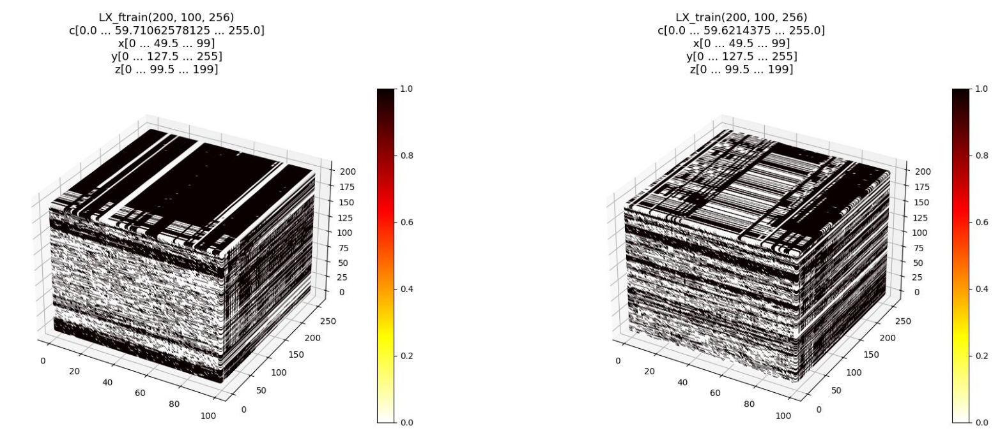

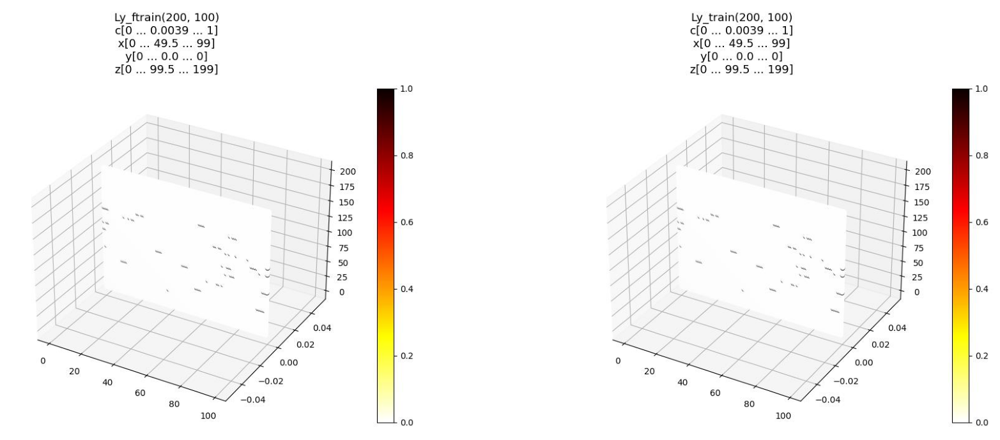

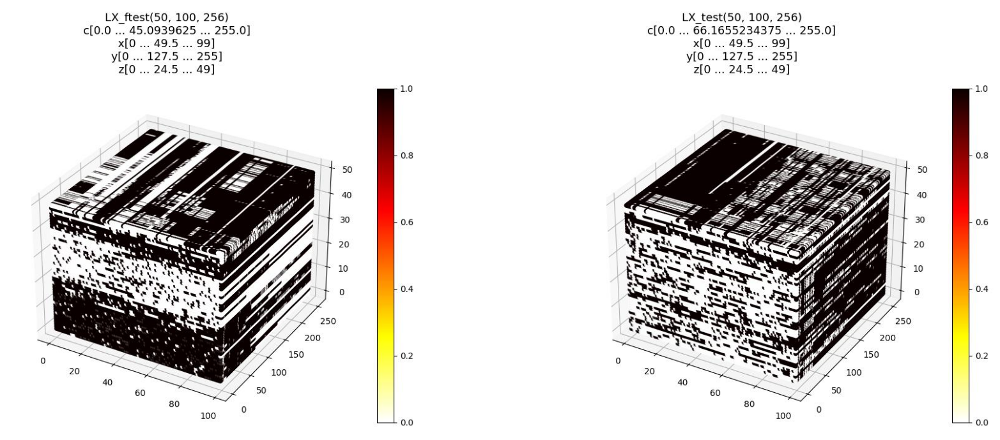

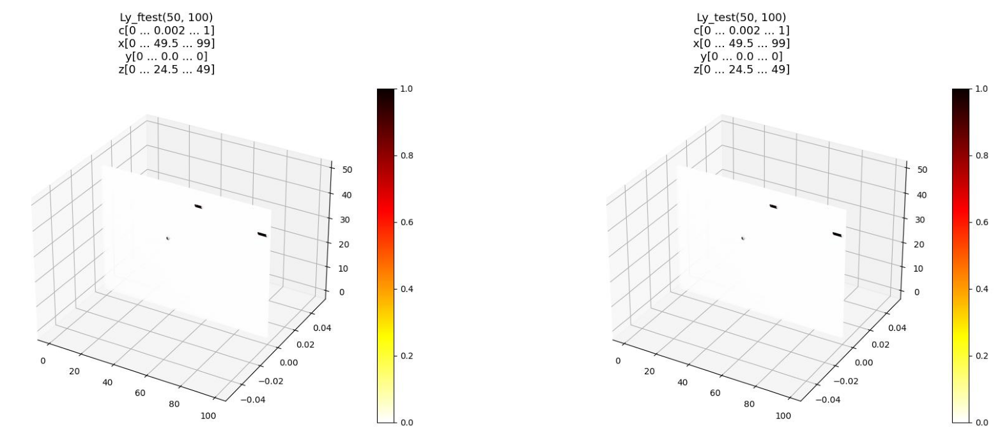

In [19]:
#@title overview featured vs normalized data IMG

show_4d_imgs(['LX_ftrain','LX_train'])
show_4d_imgs(['Ly_ftrain','Ly_train'])
show_4d_imgs(['LX_ftest','LX_test'])
show_4d_imgs(['Ly_ftest','Ly_test'])

# 4.INTRODUCTION

To create powerful models, especially for solving Seq2Seq learning problems, LSTM is the key layer.
To use LSTM effectively in models, we need to understand how it generates different results with respect to given parameters.

## 4.1.QUICK RECAP OF LSTM

### 4.1.1.Internal Structure

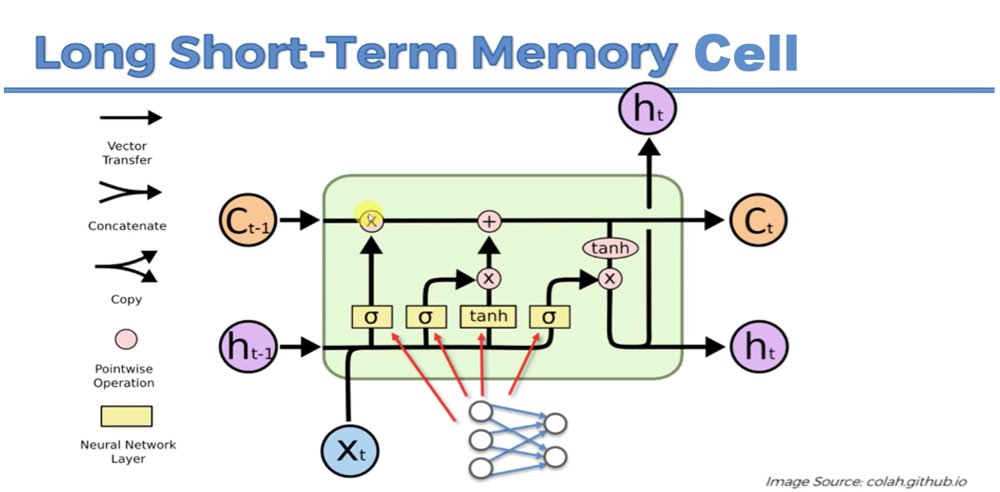

### 4.1.2.Roll-Out Representation of LSTM for each Time Step

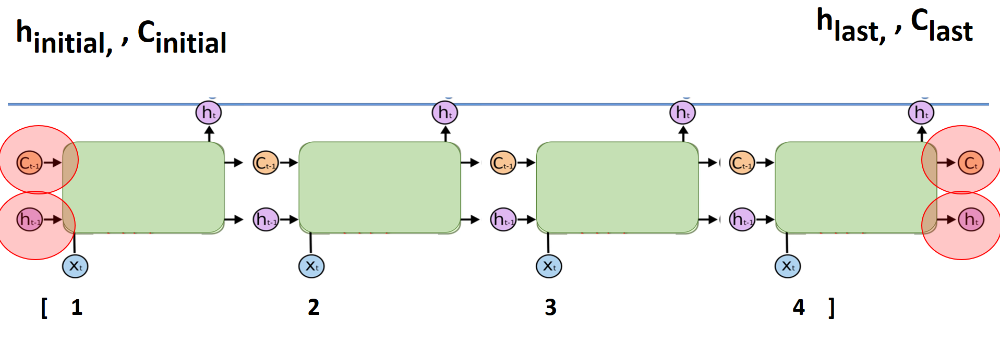

# 5.LSTM Anomaly State management

## 5.1.Model layers



In [20]:
def new_model5():
  num_outputs = 2
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model5: Model = Model(
      inputs=
      [
        input_layer,
        #seq_in,
        state_in_h,
        state_in_c
      ],
      outputs=[logits, values, state_h, state_c])
  return model5

model5 = new_model5()
model5.summary()

h = np.zeros((train_size, cell_size), np.float32)
c = np.zeros((train_size, cell_size), np.float32)
IMG['h'], IMG['c'] = ray.get([
    show_scattered_4d.remote(h, "h"),
    show_scattered_4d.remote(c, "c"),
])

2023-01-17 14:39:32.639795: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-17 14:39:32.640902: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-17 14:39:32.641606: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capability: 8.6
2023-01-17 14:39:32.642297: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 13348 MB memory:  -> device: 3, name: NVIDIA A16, pci bus id: 0000:42:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, None, 256)]  0           []                               
                                                                                                  
 dense1 (Dense)                 (None, None, 128)    32896       ['inputs[0][0]']                 
                                                                                                  
 h (InputLayer)                 [(None, 256)]        0           []                               
                                                                                                  
 c (InputLayer)                 [(None, 256)]        0           []                               
                                                                                              

## 5.2.Train



In [21]:
#@title state function

def train_state(model, x=LX_train, h=h, c=c, y=Ly_train, title=['model5', 'LX_train', 'h', 'c', 'Ly_train']):
  compile = model.predict([x, h, c])
  IMG[f"{title[4]}_predicted"], IMG[f"{title[4]}_h"], IMG[f"{title[4]}_c"] = ray.get([
    show_scattered_4d.remote(compile[1], f"{title[4]}_predicted"),
    show_scattered_4d.remote(compile[2], f"{title[4]}_h"),
    show_scattered_4d.remote(compile[3], f"{title[4]}_c"),
  ])

  show_4d_imgs([title[1], title[4], f"{title[4]}_predicted"])
  show_4d_imgs([title[1], title[2], f"{title[4]}_h"])
  show_4d_imgs([title[1], title[3], f"{title[4]}_c"])

2023-01-17 14:39:39.206636: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-01-17 14:39:40.676601: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8204


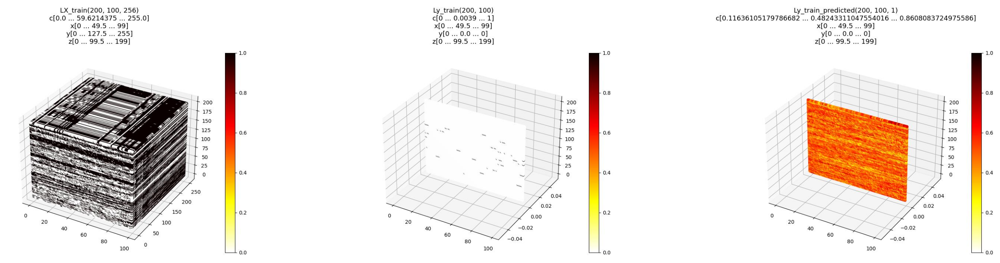

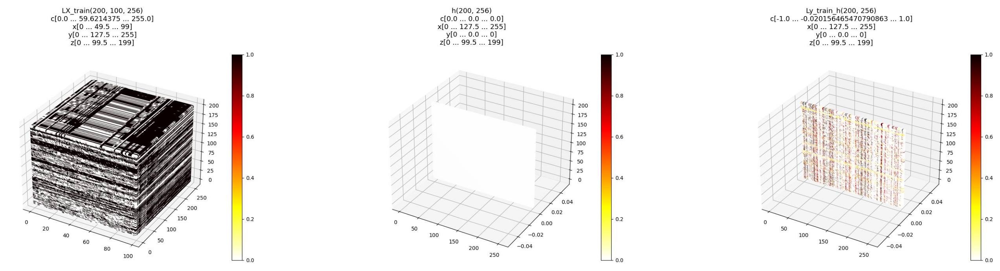

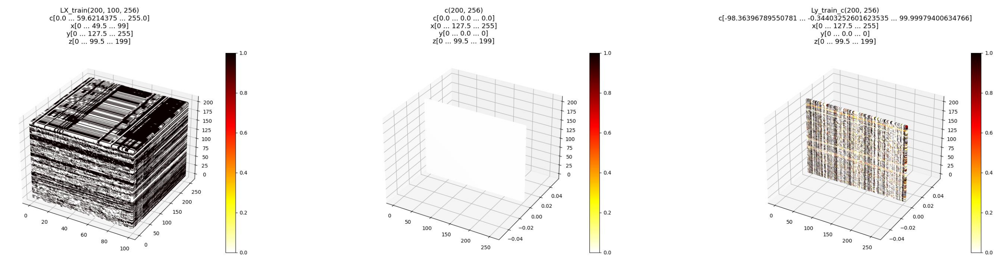

In [22]:
#@title train state

#model5.compile("adam", "binary_crossentropy", metrics=["accuracy"])
train_state(new_model5(), LX_train, h, c, Ly_train, ['model5', 'LX_train', 'h', 'c', 'Ly_train'])

In [23]:
#@title train function

def train(model, name='model'):
  model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
  history = model.fit(LX_train, Ly_train, batch_size=batch_size, epochs=epochs, validation_data=(LX_test, Ly_test))
  show_train_metric(history, name)


def ftrain(model, name='model'):
  model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
  history = model.fit(LX_ftrain, Ly_ftrain, batch_size=batch_size, epochs=epochs, validation_data=(LX_ftest, Ly_ftest))
  show_train_metric(history, name)


In [24]:
## 5.3.Infer

In [25]:
#@title infer function

def infer(model):
  ##############LX_train
  L_result1=model.predict(LX_train)
  ##############LX_test
  L_result2=model.predict(LX_test)

  IMG['Ly_train_predicted'], IMG['Ly_test_predicted'] = ray.get([
    show_scattered_4d.remote(L_result1, "Ly_train_predicted"),
    show_scattered_4d.remote(L_result2, "Ly_test_predicted"),
  ])
  show_4d_imgs(['LX_train','Ly_train','Ly_train_predicted'])
  show_4d_imgs(['LX_test','Ly_test','Ly_test_predicted'])


def finfer(model):
  ##############LX_ftrain
  L_fresult1=model.predict(LX_ftrain)
  ##############LX_ftest
  L_fresult2=model.predict(LX_ftest)

  IMG['Ly_ftrain_predicted'], IMG['Ly_ftest_predicted'] = ray.get([
    show_scattered_4d.remote(L_fresult1, "Ly_ftrain_predicted"),
    show_scattered_4d.remote(L_fresult2, "Ly_ftest_predicted"),
  ])
  show_4d_imgs(['LX_ftrain','Ly_ftrain','Ly_ftrain_predicted'])
  show_4d_imgs(['LX_ftest','Ly_ftest','Ly_ftest_predicted'])


___

# 6.LSTM Anomaly model (Primary)

## 6.1.Model layers



In [30]:
def new_model6():
  num_outputs = 10
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  #state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  #state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  #tf.nn.sigmoid
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      #initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model6: Model = Model(
      inputs=input_layer,
      #[
      #  input_layer, #seq_in,
      #  state_in_h,
      #  state_in_c
      #],
      outputs=values
      #[
      #  logits,
      #  values,
      #  state_h,
      #  state_c
      #]
      )
  return model6

model6 = new_model6()
model6.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, None, 256)]       0         
                                                                 
 dense1 (Dense)              (None, None, 128)         32896     
                                                                 
 lstm (LSTM)                 [(None, None, 256),       394240    
                              (None, 256),                       
                              (None, 256)]                       
                                                                 
 values (Dense)              (None, None, 1)           257       
                                                                 
Total params: 427,393
Trainable params: 427,393
Non-trainable params: 0
_________________________________________________________________


## 6.2.Train



Epoch 1/10
7/7 [==============================] - 2s 100ms/step - loss: 0.2005 - accuracy: 0.8842 - val_loss: 0.0154 - val_accuracy: 0.9980
Epoch 2/10
7/7 [==============================] - 0s 24ms/step - loss: 0.0319 - accuracy: 0.9961 - val_loss: 0.0158 - val_accuracy: 0.9980
Epoch 3/10
7/7 [==============================] - 0s 22ms/step - loss: 0.0316 - accuracy: 0.9961 - val_loss: 0.0151 - val_accuracy: 0.9980
Epoch 4/10
7/7 [==============================] - 0s 23ms/step - loss: 0.0289 - accuracy: 0.9961 - val_loss: 0.0145 - val_accuracy: 0.9980
Epoch 5/10
7/7 [==============================] - 0s 25ms/step - loss: 0.0271 - accuracy: 0.9961 - val_loss: 0.0144 - val_accuracy: 0.9980
Epoch 6/10
7/7 [==============================] - 0s 24ms/step - loss: 0.0263 - accuracy: 0.9961 - val_loss: 0.0144 - val_accuracy: 0.9980
Epoch 7/10
7/7 [==============================] - 0s 24ms/step - loss: 0.0259 - accuracy: 0.9961 - val_loss: 0.0145 - val_accuracy: 0.9980
Epoch 8/10
7/7 [==========

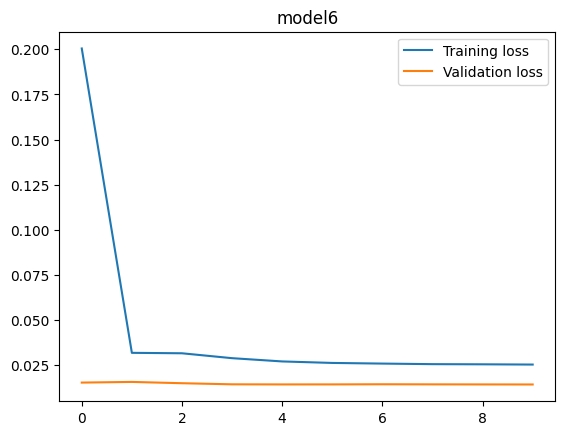

2023-01-17 14:41:34,225	WARNING worker.py:1404 -- The node with node id: b18b908a6b1500962b06c819488ec17cf65f8156ec1d85fe9f8c047d and address: 172.18.12.180 and node name: 172.18.12.180 has been marked dead because the detector has missed too many heartbeats from it. This can happen when a raylet crashes unexpectedly or has lagging heartbeats.
[2023-01-17 14:41:34,548 E 18855 19294] core_worker.cc:510: :info_message: Attempting to recover 4 lost objects by resubmitting their tasks. To disable object reconstruction, set @ray.remote(max_tries=0).
[2023-01-17 14:41:35,062 E 18855 19294] core_worker.cc:510: :info_message: Attempting to recover 4 lost objects by resubmitting their tasks. To disable object reconstruction, set @ray.remote(max_tries=0).
[2023-01-17 14:41:35,162 E 18855 19294] core_worker.cc:510: :info_message: Attempting to recover 3 lost objects by resubmitting their tasks. To disable object reconstruction, set @ray.remote(max_tries=0).
[2023-01-17 14:41:35,262 E 18855 19294]

In [31]:
train(model6, 'model6')
#ftrain(model6, 'model6')

## 6.3.Infer



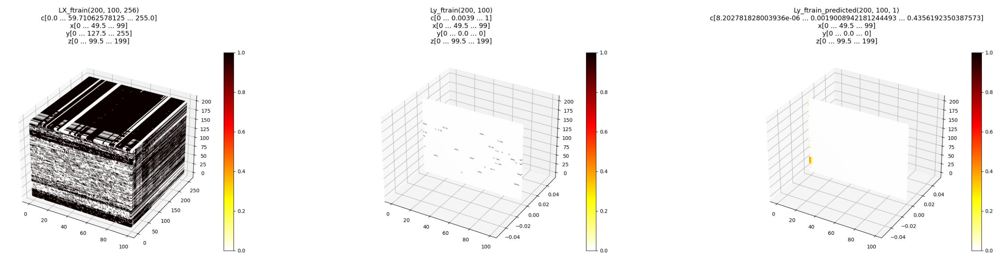

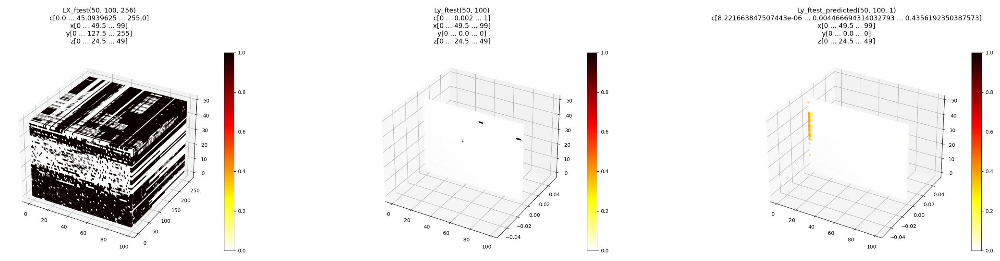

In [28]:
infer(model6)
#finfer(model6)

# 7.MODEL WEIGHTS SUMMARY

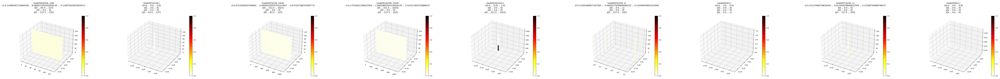

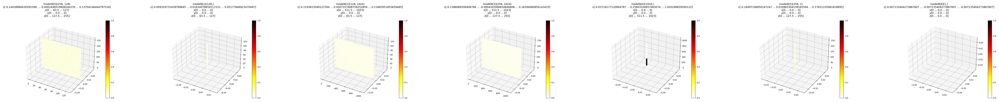

In [29]:
weights5 = show_weights(model5, 'model5')
weights6 = show_weights(model6, 'model6')

show_4d_imgs(weights5)
show_4d_imgs(weights6)